<a href="https://colab.research.google.com/github/sfatimazahra/AI-Headshot-Generator/blob/master/image_to_image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Installation and Imports**

In [1]:
!pip install accelerate
!pip install git+https://github.com/huggingface/diffusers

import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
print(torch.__version__)

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

**Functions**

In [27]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def plotgrid(list_images, list_titles, rows, cols, grid, figname, figsize=(10, 10)):
    num_images  = len(list_images)
    num_cols    = cols
    num_rows    = rows

    # Create a grid of subplots.
    fig, axes = plt.subplots(num_rows, num_cols, figsize=figsize)
    # ax[rows,cols]
    if isinstance(axes, np.ndarray):
        list_axes = list(axes.flat)
    else:
        list_axes = [axes]

    # Create list of axes for easy iteration.
    for i in range(num_images):
          img    = list_images[i]
          title  = list_titles[i] if list_titles is not None else 'Image %d' % (i)
          list_axes[i].imshow(img)
          list_axes[i].set_title(title)
          list_axes[i].grid(grid)

    for i in range(num_images, len(list_axes)):
        list_axes[i].set_visible(False)

    fig.tight_layout()
    _ = plt.show()
    plt.savefig(figname) if figname is not None else 'Untitled'


# # Load some images
# image1 = Image.open("/content/drive/MyDrive/deeju/DSC03103.jpg")
# image2 = Image.open("/content/drive/MyDrive/deeju/DSC03104.jpg")
# image3 = Image.open("/content/drive/MyDrive/deeju/DSC03105.jpg")
# image4 = Image.open("/content/drive/MyDrive/deeju/DSC03106.jpg")
# image5 = Image.open("/content/drive/MyDrive/deeju/DSC03107.jpg")

# image_list = [image1, image2, image3, image4, image5]
# titles = ['dej1', 'dej2', 'dej3', 'dej4', 'dej5']
# plotgrid(image_list, titles, 2, 3, True)


**Image to Image**

In [2]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image

model_id = "runwayml/stable-diffusion-v1-5"
pipeline = AutoPipelineForImage2Image.from_pretrained(
    model_id, torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
# pipeline.enable_xformers_memory_efficient_attention()

# prepare image
url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/img2img-init.png"



The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/608M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

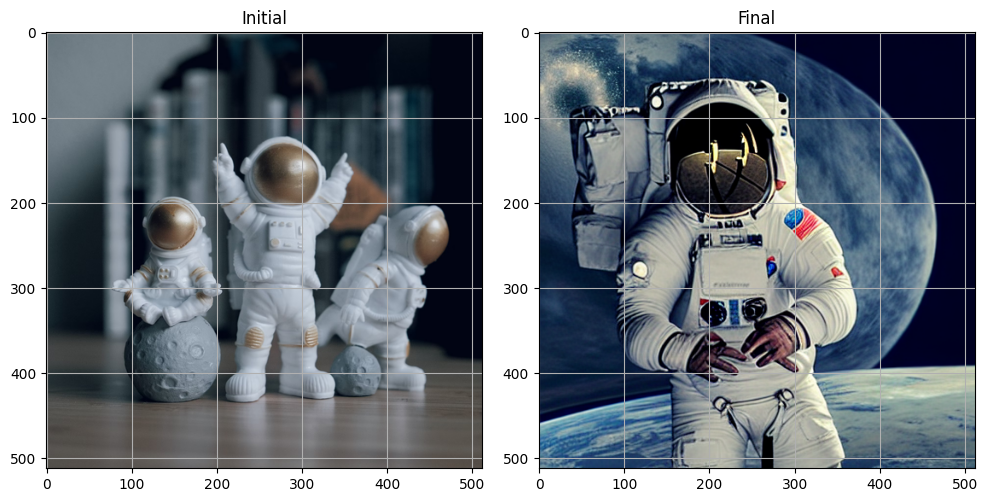

<Figure size 640x480 with 0 Axes>

In [29]:
prompt = "Astronaut with a white background"
# pass prompt and image to pipeline
images = []
init_image = load_image(url)
images.append(init_image)
image = pipeline(prompt, image=init_image).images[0]
images.append(image)
titles = ['Initial', 'Final']
plotgrid(images, titles, 1, 2, True, 'AutoPipe Image2Image.png')


Changing Strengths

['Strength 0.2', 'Strength 0.35', 'Strength 0.5', 'Strength 0.65', 'Strength 0.8']


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

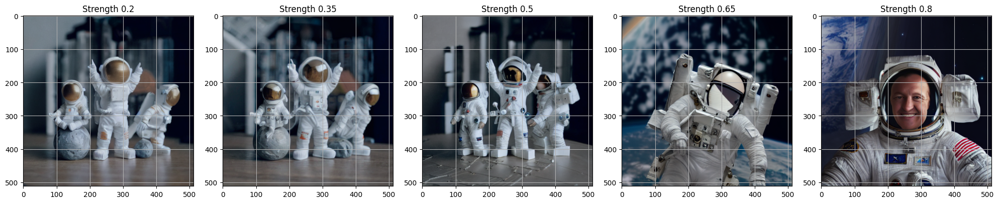

<Figure size 640x480 with 0 Axes>

In [7]:
prompt = "Astronaut with a white background"

strengths = np.linspace(0.2, 0.8, num=5).round(2)
titles = []
for i in range(len(strengths)):
    titles.append(f"Strength {strengths[i]}")
print(titles)

# Generate images for different strengths
images_strengths = []
for strength in strengths:
    image = pipeline(prompt, image=init_image, strength=strength).images[0]
    images_strengths.append(image)

# Create image grid
plotgrid(images_strengths, titles, 1, 5, True,'Changing Strength.png', figsize=(20, 20))

['Guidance 7.0', 'Guidance 7.25', 'Guidance 7.5', 'Guidance 7.75', 'Guidance 8.0']


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

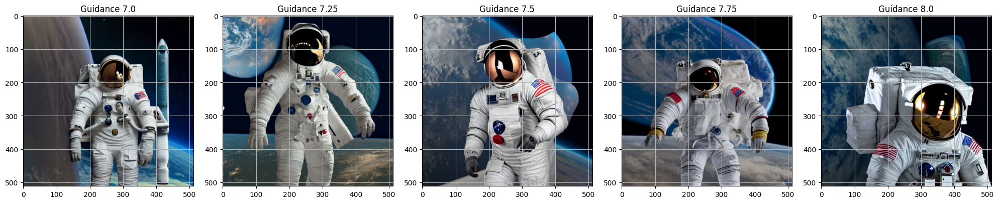

<Figure size 640x480 with 0 Axes>

In [11]:
prompt = "Astronaut with a white background"

guidance_scales = np.linspace(7, 8, num=5).round(2)
titles = []
for i in range(len(guidance_scales)):
    titles.append(f"Guidance {guidance_scales[i]}")
print(titles)

# Generate images for different strengths
images_guidance = []
for guidance_scale in guidance_scales:
    image = pipeline(prompt, image=init_image, guidance_scale=guidance_scale).images[0]
    images_guidance.append(image)

# Create image grid
plotgrid(images_guidance, titles, 1, 5, True,'Changing Guidance.png', figsize=(20, 20))

['Inference Steps 40', 'Inference Steps 55', 'Inference Steps 70', 'Inference Steps 85', 'Inference Steps 100']


  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/68 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

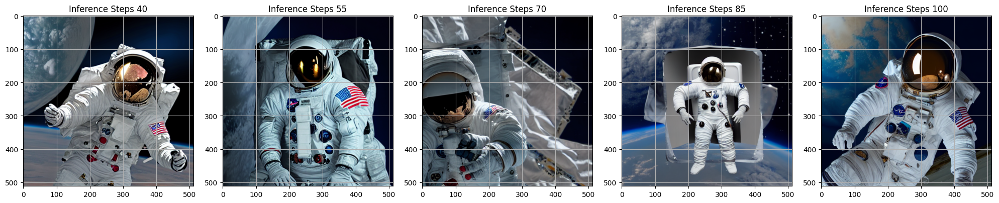

<Figure size 640x480 with 0 Axes>

In [12]:
prompt = "Astronaut with a white background"

inference_steps = np.linspace(40, 100, num=5).astype(int)  # Convert to integers
titles = []
for i in range(len(inference_steps)):
    titles.append(f"Inference Steps {inference_steps[i]}")
print(titles)

# Generate images for different strengths
images_infer = []
for step in inference_steps:
    image = pipeline(prompt, image=init_image, num_inference_steps=step).images[0]
    images_infer.append(image)

# Create image grid
plotgrid(images_infer, titles, 1, 5, True,'Changing Inference.png', figsize=(20, 20))


Tweaking strengths, guidance scale, and inference steps

---



Strength 0.2, 
 Guidance 7.0, 
 Steps 20
Strength 0.35, 
 Guidance 7.25, 
 Steps 27
Strength 0.5, 
 Guidance 7.5, 
 Steps 35
Strength 0.65, 
 Guidance 7.75, 
 Steps 42
Strength 0.8, 
 Guidance 8.0, 
 Steps 50


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

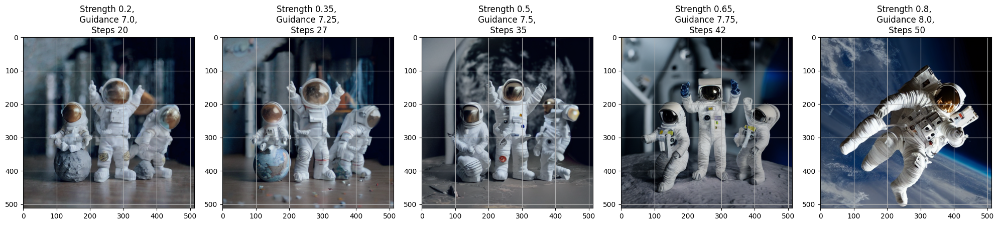

In [ ]:
strengths = np.linspace(0.2, 0.8, num=5).round(2)
guidance_scales = np.linspace(7, 8, num=5).round(2)
inference_steps = np.linspace(20, 50, num=5).astype(int)  # Convert to integers
titles = []

for i in range(len(strengths)):
    titles.append(f"Strength {strengths[i]}, \n Guidance {guidance_scales[i]}, \n Steps {inference_steps[i]}")
    print(titles[i])


# Generate images for different parameter combinations
images_all5 = []

for i in range (len(strengths)):
  image = pipeline(prompt, image=init_image, strength=strengths[i], guidance_scale=guidance_scales[i], num_inference_steps=inference_steps[i]).images[0]
  images_all5.append(image)

plotgrid(images_all5, titles, 1, 5, True,'Changing All (5).png', figsize=(20, 20))

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

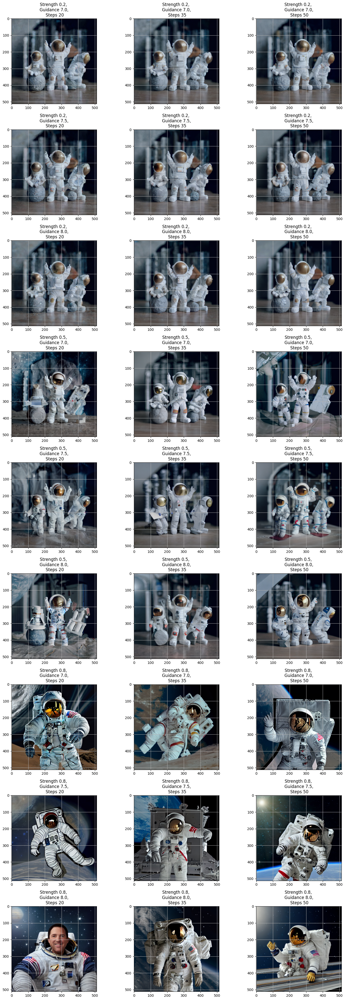

<Figure size 640x480 with 0 Axes>

In [33]:
prompt = "Astronaut with a white background"
strengths = np.linspace(0.2, 0.8, num=3).round(2)
guidance_scales = np.linspace(7, 8, num=3).round(2)
inference_steps = np.linspace(20, 50, num=3).astype(int)  # Convert to integers
titles = []
# Generate images for different parameter combinations
images_all27 = []
for i in strengths:
  for j in guidance_scales:
    for k in inference_steps:
      image = pipeline(prompt, image=init_image, strength=i, guidance_scale=j, num_inference_steps=k).images[0]
      titles.append(f"Strength {i}, \n Guidance {j}, \n Steps {k}")
      images_all27.append(image)

plotgrid(images_all27, titles, 9, 3, True, 'Changing All (27).png', figsize=(15, 40))


Uploading image from drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
image_path = "/content/drive/MyDrive/Images/your_image.jpg"
init_image = load_image(image_path)


Different Pipeline

In [13]:
from diffusers import StableDiffusionDepth2ImgPipeline

model_id = "stabilityai/stable-diffusion-2-depth"
pipe = StableDiffusionDepth2ImgPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16).to("cuda")
# prepare image
url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/img2img-init.png"


model_index.json:   0%|          | 0.00/545 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

depth_estimator/config.json:   0%|          | 0.00/9.96k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/346 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/923 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/732 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/382 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/490M [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.07k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/716 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

No tweaks

  0%|          | 0/40 [00:00<?, ?it/s]

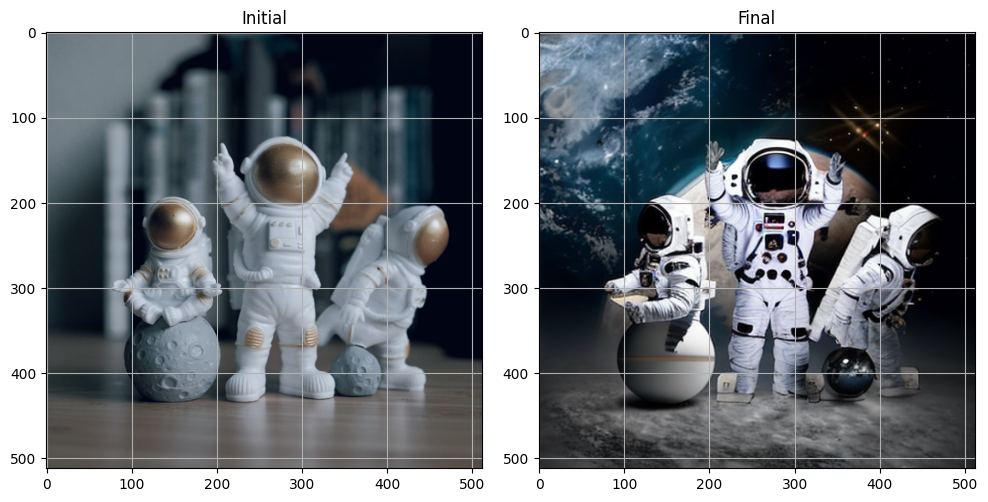

<Figure size 640x480 with 0 Axes>

In [30]:
prompt = "Astronaut with a white background"
images = []
init_image = load_image(url)
images.append(init_image)
# pass prompt and image to pipeline
image = pipe(prompt, image=init_image).images[0]
images.append(image)
titles = ['Initial', 'Final']
plotgrid(images, titles, 1, 2, True, 'Depth2Img Pipe.png')

Strength 0.2, 
 Guidance 7.0, 
 Steps 20
Strength 0.35, 
 Guidance 7.25, 
 Steps 27
Strength 0.5, 
 Guidance 7.5, 
 Steps 35
Strength 0.65, 
 Guidance 7.75, 
 Steps 42
Strength 0.8, 
 Guidance 8.0, 
 Steps 50


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

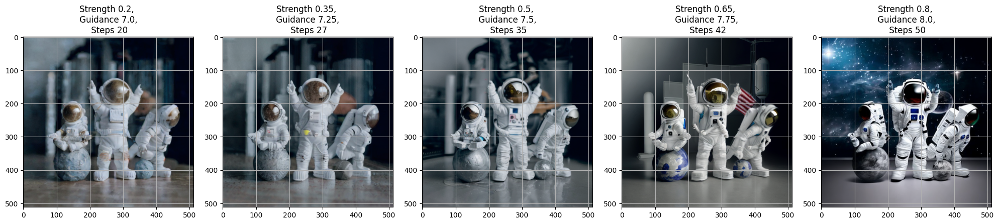

<Figure size 640x480 with 0 Axes>

In [15]:
strengths = np.linspace(0.2, 0.8, num=5).round(2)
guidance_scales = np.linspace(7, 8, num=5).round(2)
inference_steps = np.linspace(20, 50, num=5).astype(int)  # Convert to integers
titles = []

for i in range(len(strengths)):
    titles.append(f"Strength {strengths[i]}, \n Guidance {guidance_scales[i]}, \n Steps {inference_steps[i]}")
    print(titles[i])

# Generate images for different parameter combinations
images_all5 = []

for i in range (len(strengths)):
  image = pipe(prompt, image=init_image, strength=strengths[i], guidance_scale=guidance_scales[i], num_inference_steps=inference_steps[i]).images[0]
  images_all5.append(image)

plotgrid(images_all5, titles, 1, 5, True,'Changing All, New Pipe(5).png' figsize=(20, 20))


  0%|          | 0/25 [00:00<?, ?it/s]

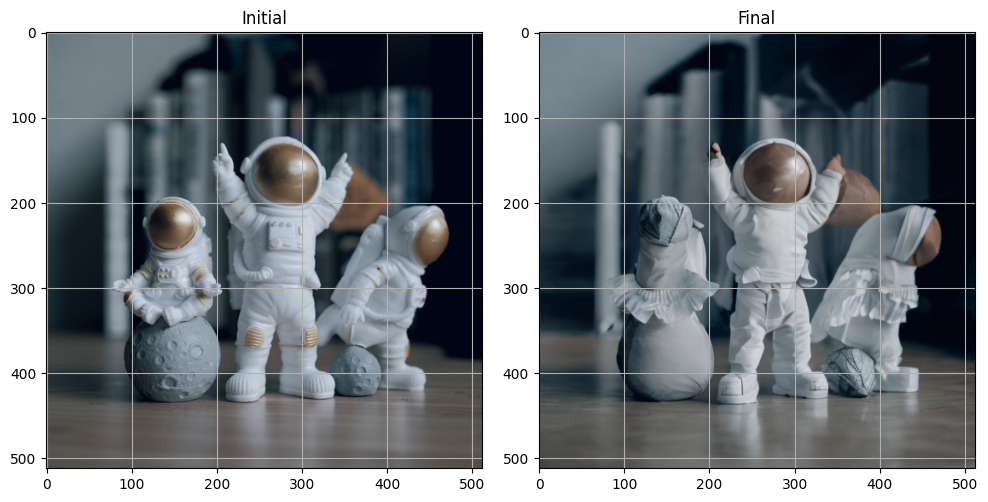

<Figure size 640x480 with 0 Axes>

In [32]:
images = []
prompt = "one astronaut with a plain white background"
negprompt = "multiple astronauts"
images.append(init_image)
# pass prompt and image to pipeline
image = pipe(prompt, image=init_image, negative_prompt= negprompt, strength= 0.5, guidance_scale= 7.5, num_inference_steps= 50).images[0]
images.append(image)
plotgrid(images, titles, 1, 2, True, 'Negative Prompt.png')


Saving outputs in Drive

In [36]:
import shutil
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive')

# Source directory (where your images are in Colab)
source_dir = '/content'

# Destination directory (where you want to save images in Drive)
destination_dir = '/content/drive/MyDrive/Colab Notebooks'

# Create destination directory if it doesn't exist
os.makedirs(destination_dir, exist_ok=True)

# Copy only .png files
for file_name in os.listdir(source_dir):
  if file_name.endswith(".png"):
    source_file = os.path.join(source_dir, file_name)
    destination_file = os.path.join(destination_dir, file_name)
    shutil.copy(source_file, destination_file)

print("Images copied successfully!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Images copied successfully!
